In this notebook we review some best practices for compilation.

In [1]:
import qiskit
qiskit.__version__

'1.2.1'

#### step 1: mapping problem to a quantum circuit

We study a 6-qubit Fermi-Hubbard model, and try to map and optimize it on a ring of 12 qubits (on "plaquette" in the heavy-hex architecture).

The first step is to build the Fermionic Hamiltonian that we wish to simulate, and convert it to a qubit Hamiltonian. We use qiskit-nature for this, but any other similar package can work. Here we use the Bravyi-Kitaev Superfast method for Fermion-to-qubit mapping [https://journals.aps.org/prresearch/pdf/10.1103/PhysRevResearch.1.033033]

In [2]:
from qiskit_nature.second_q import hamiltonians, mappers

t = 1     # interaction
U = -0.5  # on-site potential
lattice = hamiltonians.lattices.SquareLattice(rows=3, cols=3)

model = hamiltonians.FermiHubbardModel(lattice, onsite_interaction=U)
fermionic_hamiltonian = model.second_q_op().simplify()

print(f"Fermionic Hamiltonian:\n {fermionic_hamiltonian}\n")

qubit_hamiltonian = mappers.BravyiKitaevSuperFastMapper().map(
    fermionic_hamiltonian
)
print(f"Qubit Hamiltonian:\n {qubit_hamiltonian}\n")
print(f'{qubit_hamiltonian.num_qubits} qubits, {len(qubit_hamiltonian)} Pauli terms')

from qiskit.circuit.library import PauliEvolutionGate
from qiskit.circuit import QuantumCircuit
circuit = QuantumCircuit(qubit_hamiltonian.num_qubits)
circuit = circuit.compose(PauliEvolutionGate(qubit_hamiltonian))

Fermionic Hamiltonian:
 Fermionic Operator
number spin orbitals=18, number terms=57
  (1+0j) * ( +_0 -_2 )
+ (-1+0j) * ( -_0 +_2 )
+ (1+0j) * ( +_0 -_6 )
+ (-1+0j) * ( -_0 +_6 )
+ (1+0j) * ( +_6 -_8 )
+ (-1+0j) * ( -_6 +_8 )
+ (1+0j) * ( +_6 -_12 )
+ (-1+0j) * ( -_6 +_12 )
+ (1+0j) * ( +_12 -_14 )
+ (-1+0j) * ( -_12 +_14 )
+ (1+0j) * ( +_2 -_4 )
+ (-1+0j) * ( -_2 +_4 )
+ (1+0j) * ( +_2 -_8 )
+ (-1+0j) * ( -_2 +_8 )
+ (1+0j) * ( +_8 -_10 )
+ (-1+0j) * ( -_8 +_10 )
+ (1+0j) * ( +_8 -_14 )
+ (-1+0j) * ( -_8 +_14 )
+ (1+0j) * ( +_14 -_16 )
+ (-1+0j) * ( -_14 +_16 )
+ (1+0j) * ( +_4 -_10 )
+ (-1+0j) * ( -_4 +_10 )
+ (1+0j) * ( +_10 -_16 )
+ (-1+0j) * ( -_10 +_16 )
+ (1+0j) * ( +_1 -_3 )
+ (-1+0j) * ( -_1 +_3 )
+ (1+0j) * ( +_1 -_7 )
+ (-1+0j) * ( -_1 +_7 )
+ (1+0j) * ( +_7 -_9 )
+ (-1+0j) * ( -_7 +_9 )
+ (1+0j) * ( +_7 -_13 )
+ (-1+0j) * ( -_7 +_13 )
+ (1+0j) * ( +_13 -_15 )
+ (-1+0j) * ( -_13 +_15 )
+ (1+0j) * ( +_3 -_5 )
+ (-1+0j) * ( -_3 +_5 )
+ (1+0j) * ( +_3 -_9 )
+ (-1+0j) * ( -_3 +_9

In [3]:
qubit_hamiltonian[:10]

SparsePauliOp(['IIIIIIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIYI', 'IIIIIIIIIIIIIIIIIIIIIIZY', 'IIIIIIIIIIIIIIIIIIIIIIZZ', 'IIIIIIIIIIIIIIIIIIIIYIII', 'IIIIIIIIIIIIIIIIIIIIZYII', 'IIIIIIIIIIIIIIIIIIIIZZII', 'IIIIIIIIIIIIIIIIIIIIZZZZ', 'IIIIIIIIIIIIIIIIIIYIIIII', 'IIIIIIIIIIIIIIIIIIZYIIII'],
              coeffs=[-1.125+0.j,  0.5  +0.j,  0.5  +0.j,  0.125+0.j,  0.5  +0.j,  0.5  +0.j,
  0.125+0.j, -0.125+0.j,  0.5  +0.j,  0.5  +0.j])

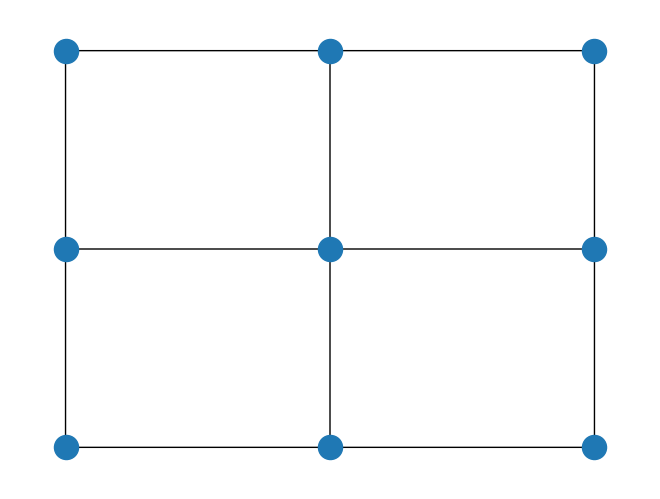

In [4]:
lattice.draw()

#### Step 2. synthesis and optimization of the circuit

#### step 2a) synthesis of Paulis

qubits: 24
2q-depth: 123
2q-size: 240


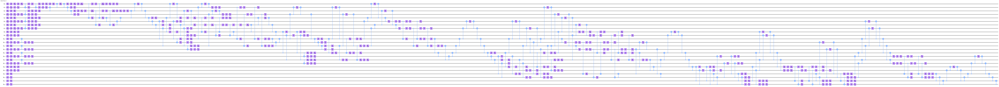

In [5]:
# synthesis using qiskit
from qiskit.transpiler import PassManager
from qiskit import generate_preset_pass_manager

pm = generate_preset_pass_manager(optimization_level=3, basis_gates=['cx', 'sx', 'rz'])
circuit_synth = pm.run(circuit)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_synth.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_synth.size(lambda x: x.operation.num_qubits==2)}')
circuit_synth.draw('mpl', fold=-1, style='clifford')

+ **Tip**: the `rustiq` plugin performs quite well on Hamiltonian simulation circuits 

qubits: 24
2q-depth: 54
2q-size: 332


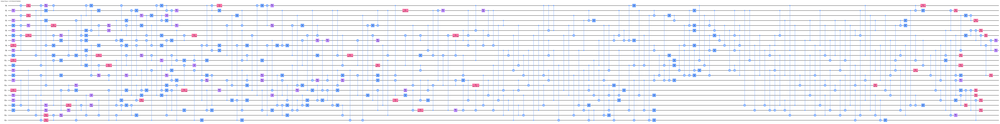

In [6]:
# synthesis using qiskit plugin
from qiskit.transpiler.passes.synthesis.high_level_synthesis import HLSConfig

hls_config=HLSConfig(
    PauliEvolution=[
        ("rustiq_pauli_evolution", 
        {"nshuffles": 400, "fix_clifford": True, "preserve_order": False, "metric": "depth"})
    ]
)
pm = generate_preset_pass_manager(optimization_level=2, hls_config=hls_config)
circuit_synth = pm.run(circuit)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_synth.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_synth.size(lambda x: x.operation.num_qubits==2)}')
circuit_synth.draw('mpl', fold=-1, style='clifford')

+ **Tip**: now notice that if you need to measure an observable from this circuit,
you can save a lot of gates by dropping the final Clifford,
and just changing your observable Paulis

qubits: 24
2q-depth: 21
2q-size: 162


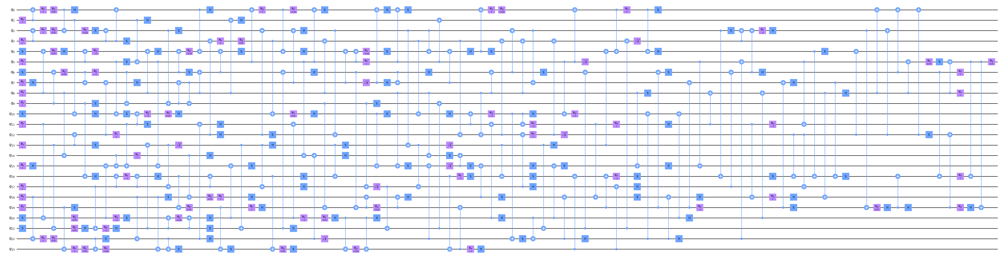

In [7]:
hls_config=HLSConfig(
    PauliEvolution=[
        ("rustiq_pauli_evolution", 
        {"nshuffles": 400, "fix_clifford": False, "preserve_order": False, "metric": "depth"})
    ]
)
pm = generate_preset_pass_manager(optimization_level=0, hls_config=hls_config)
circuit_synth = pm.run(circuit)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_synth.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_synth.size(lambda x: x.operation.num_qubits==2)}')
circuit_synth.draw('mpl', fold=-1, style='clifford')

#### step 2b) routing the circuit

In [8]:
# choosing the circuit
from qiskit_ibm_runtime.fake_provider import torino
backend = torino.FakeTorino()
target = backend.target

In [9]:
# using Sabre to route
from qiskit.transpiler import CouplingMap

pm = generate_preset_pass_manager(optimization_level=3, target=target, layout_method='sabre', routing_method='sabre')

circuit_routed = pm.run(circuit_synth)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_routed.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_routed.size(lambda x: x.operation.num_qubits==2)}')
circuit_routed.draw('mpl', fold=-1, style='clifford', idle_wires=False)

qubits: 24
2q-depth: 243
2q-size: 711


+ **Tip**: try multiple times, result often improve

In [10]:
depth = 1000
for seed in range(100):
    candidate = pm.run(circuit_synth)
    new_depth = candidate.depth(lambda x: x.operation.num_qubits==2)
    if new_depth < depth:
        depth = new_depth
        circuit_routed = candidate

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_routed.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_routed.size(lambda x: x.operation.num_qubits==2)}')
circuit_routed.draw('mpl', fold=-1, style='clifford', idle_wires=False)

qubits: 24
2q-depth: 167
2q-size: 707


qubits: 24
2q-depth: 108
2q-size: 411


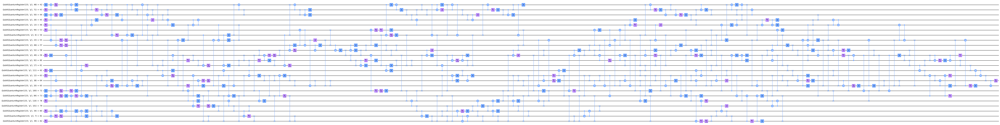

In [11]:
# using the AI-trained routing pass 
from qiskit_ibm_transpiler.ai.routing import AIRouting

pm = PassManager([
  AIRouting(backend_name='ibm_torino', optimization_level=3, layout_mode="optimize"),  # Route circuit
])
circuit_routed = pm.run(circuit_synth)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_routed.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_routed.size(lambda x: x.operation.num_qubits==2)}')
circuit_routed.draw('mpl', fold=-1, style='clifford', idle_wires=False)

#### step 2c) convert to the correct basis

In [12]:
from qiskit.converters import dag_to_circuit
def callback(**kwargs):
    pass_ = kwargs['pass_']
    dag = kwargs['dag']
    time = kwargs['time']
    property_set = kwargs['property_set']
    count = kwargs['count']
    print(pass_)
    display(dag_to_circuit(dag).draw('mpl', fold=-1, style='clifford'))

pm = generate_preset_pass_manager(optimization_level=3, target=target, basis_gates=['cx', 'sx', 'rz'])
circuit_basis = pm.run(circuit_routed)

print(f'qubits: {circuit_basis.num_qubits}')
print(f'2q-depth: {circuit_basis.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_basis.size(lambda x: x.operation.num_qubits==2)}')
circuit_basis.draw('mpl', fold=200, style='clifford', idle_wires=False)

qubits: 133
2q-depth: 193
2q-size: 716


#### step 2d) layout on the best qubits

The transpiler at higher optimization levels uses the VF2Layout pass which will pick the best physical ring of 12 on the device for our circuit [https://journals.aps.org/prxquantum/pdf/10.1103/PRXQuantum.4.010327]

+ **Tip:** Since we have already done routing, we will set `routing_method='none'` to ensure the transpiler won't do any unexpected routing.

In [13]:
from qiskit_ibm_runtime.fake_provider import FakePeekskill

backend = FakePeekskill()
pm = generate_preset_pass_manager(target=target, optimization_level=2)
circuit_layout = pm.run(circuit_basis)

print(f'qubits: {circuit_layout.num_qubits}')
print(f'2q-depth: {circuit_layout.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_layout.size(lambda x: x.operation.num_qubits==2)}')
circuit_layout.draw('mpl', fold=200, style='clifford', idle_wires=False)

qubits: 133
2q-depth: 187
2q-size: 690


#### step 2e) 2-qubit unitary approximation

You can ask Qiskit to approximate your circuit by replacing 2-qubit subcircuits by fewer gates if it meets some closeness criteria. This is worth it if your 2-qubit gates are somewhat noisy. [https://journals.aps.org/pra/pdf/10.1103/PhysRevA.100.032328]

+ **Tip**: passing `approximation_degree='none'` will consult the Target for error rates and tailor approximation to the error rate of each 2-qubit gate.

In [14]:
pm = generate_preset_pass_manager(target=backend.target, optimization_level=3, approximation_degree=.99)
circuit_approx = pm.run(circuit_basis)

print(f'qubits: {circuit.num_qubits}')
print(f'2q-depth: {circuit_approx.depth(lambda x: x.operation.num_qubits==2)}')
print(f'2q-size: {circuit_approx.size(lambda x: x.operation.num_qubits==2)}')

qubits: 24
2q-depth: 186
2q-size: 678


#### step 2f) scheduling. 

+ **Tip:** If you use Eagle devices, it is really important to apply dynamical decoupling. This can suppress coherent Z and ZZ errors from accumulating in the circuit. There are more complicated DD passes being developed so ask around [https://arxiv.org/abs/2403.06852, https://journals.aps.org/pra/abstract/10.1103/PhysRevA.88.052306].

In [16]:
from qiskit.transpiler.passes import ALAPScheduleAnalysis, PadDynamicalDecoupling
from qiskit.circuit.library import XGate

pm = PassManager([
    ALAPScheduleAnalysis(target=target),
    PadDynamicalDecoupling(target=target, dd_sequence=[XGate(), XGate()])
])

circuit_scheduled = pm.run(circuit_layout)

+ **Tip**: inspect the circuit before execution. Make sure there is nothing unexpected.

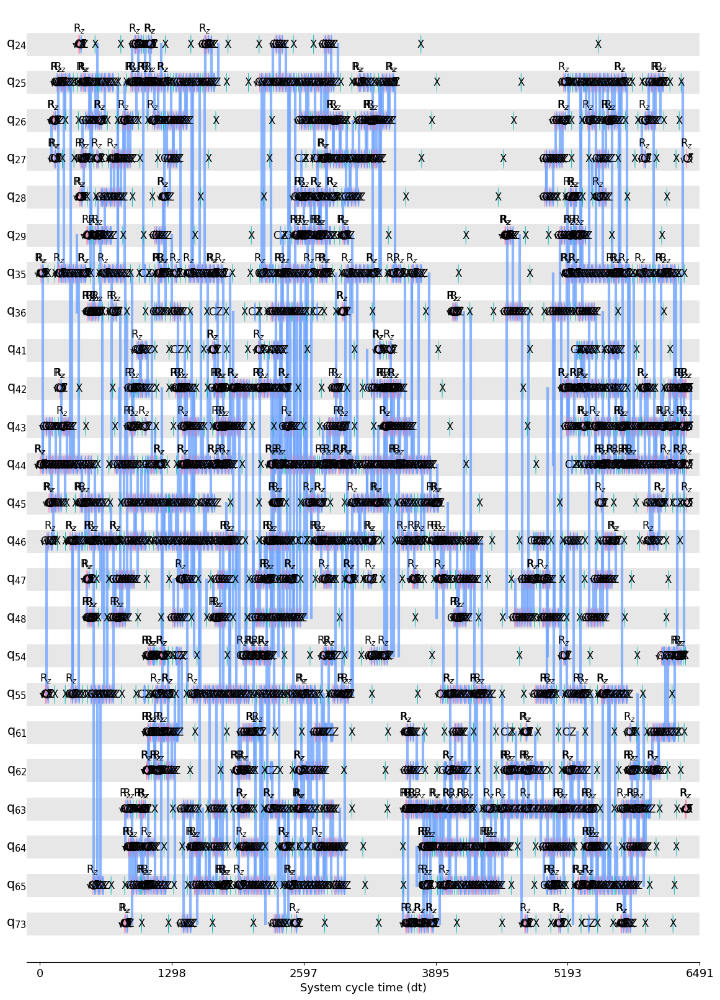

In [17]:
from qiskit.visualization import timeline_drawer
timeline_drawer(circuit_scheduled, show_idle=False)

+ **Tip:** If you have a circuit with large networks of CNOTs or Cliffords, then use specialized methods to optimize those blocks.
+ **Tip:** If you have a lot of gates appearing on relatively few qubits, use numerical approximation methods for the block.